# TAE-IA · Module 6 · L05 — ControlNet: Structure-Guided Generation

| | |
|---|---|
| **Module** | 6 — Practical AI Applications: Images and Audio |
| **Lesson** | L05 |
| **Track** | A — Vision |
| **Estimated duration** | 2 hours |
| **GPU required** | T4 (Colab) |
| **Prerequisites** | L01–L04 completed; L04 cleanup cell run |

## Learning objectives
By the end of this notebook you will be able to:
- [ ] Explain how ControlNet injects conditioning signals into the UNet without modifying its frozen weights
- [ ] Extract Canny edges and depth maps as conditioning inputs
- [ ] Use `StableDiffusionControlNetPipeline` with Canny and depth conditioners
- [ ] Tune `controlnet_conditioning_scale` and explain its effect

## Before you start
- L04 cleanup cell must have been run — frees Drive space for this lab's models
- T4 GPU runtime selected (`Runtime > Change runtime type > T4 GPU`)

---

## Cell 0 — Setup (always run this first)

> Mounts Drive, checks GPU, fixes seed, and logs in to HuggingFace.

In [ ]:
# ================================================================
# TAE-IA M6 · Standard Setup -- DO NOT MODIFY THIS CELL
# ================================================================
import os, sys, random, shutil
import numpy as np

from google.colab import drive
drive.mount('/content/drive')

MODEL_CACHE = '/content/drive/MyDrive/TAE_IA_M6/models'
os.makedirs(MODEL_CACHE, exist_ok=True)
print(f'Model cache: {MODEL_CACHE}')

# Clear any cache left by earlier course versions.
for _leftover in ('hub', 'xet'):
    _p = os.path.join(MODEL_CACHE, _leftover)
    if os.path.exists(_p):
        shutil.rmtree(_p)

import torch
if not torch.cuda.is_available():
    print('\nNo GPU detected. Go to: Runtime > Change runtime type > T4 GPU')
    raise SystemExit('GPU required.')

gpu_name = torch.cuda.get_device_name(0)
vram_gb  = torch.cuda.get_device_properties(0).total_memory / 1e9
print(f'GPU: {gpu_name}  |  VRAM: {vram_gb:.1f} GB')

SEED = 42
random.seed(SEED); np.random.seed(SEED)
torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
print(f'Fixed seed: {SEED}')
print(f'Python {sys.version.split()[0]}  |  PyTorch {torch.__version__}')

# HuggingFace login -- needed every new Colab session
import huggingface_hub

try:
    _token = huggingface_hub.get_token()
except Exception:
    _token = None

if _token:
    print(f"Already logged in to HuggingFace as: {huggingface_hub.whoami()['name']}")
else:
    try:
        from google.colab import userdata
        _hf_token = userdata.get('HF_TOKEN')
    except Exception:
        _hf_token = None

    if _hf_token:
        huggingface_hub.login(token=_hf_token, add_to_git_credential=False)
        print(f"Logged in to HuggingFace as: {huggingface_hub.whoami()['name']}")
    else:
        raise RuntimeError(
            'No HF_TOKEN found in Colab Secrets (key icon, left sidebar).\n'
            'Add a secret named HF_TOKEN with your HuggingFace read token, enable notebook access, '
            'then re-run this cell.\n'
            'See L00 Cell 4 if you need to generate a token or accept the SD 1.5 license.'
        )

Mounted at /content/drive
Model cache: /content/drive/MyDrive/TAE_IA_M6/models
GPU: Tesla T4  |  VRAM: 15.6 GB
Fixed seed: 42
Python 3.13.15  |  PyTorch 2.11.0+cu128
Already logged in to HuggingFace as: Juan-AquinoH


In [ ]:
# ================================================================
# Install dependencies for L05
# controlnet-aux provides preprocessing detectors (Canny, MiDaS, etc.)
# ================================================================
!pip install diffusers transformers accelerate controlnet-aux opencv-python-headless -q

import diffusers, controlnet_aux, cv2
print(f'diffusers {diffusers.__version__}  |  controlnet-aux {controlnet_aux.__version__}  |  OpenCV {cv2.__version__}')

---
## Part 1 — Context and Key Concepts

> Read this before running any code.

### The problem text prompts cannot solve

Text prompts excel at controlling *what* is in the image and *how it looks* (style, color, mood). They are poor at controlling *where* things are, *how* the camera is positioned, or *what pose* a subject holds. Running the same composition-specific prompt ten times produces ten different layouts.

img2img partially solves this by starting from an existing image, but it requires a near-finished source — a rough sketch or wireframe gives poor results because img2img encodes the *pixels*, not the *structure*.

### ControlNet architecture

ControlNet (Zhang et al., 2023) adds a **trainable copy of the UNet encoder** alongside the frozen SD 1.5 model:

```
Conditioning image (Canny / depth)
    │
    ▼
ControlNet Encoder  ← trainable, initialized from UNet encoder weights
    │  outputs feature maps at each resolution scale
    ▼  added to UNet skip connections and mid block
UNet (frozen SD 1.5)
    │
    ▼
VAE Decoder → output image
```

Because the SD 1.5 weights are frozen, **all of its generation quality is preserved**. ControlNet only adds structural guidance on top.

### `controlnet_conditioning_scale`

This parameter (default `1.0`) controls how strongly the ControlNet signal influences the output:
- `0.5`: soft guidance — model has more creative freedom, structure loosely followed
- `1.0`: balanced — good default for most use cases
- `1.5+`: strict guidance — model rigidly follows the control signal, may reduce image quality

### Canny vs. Depth conditioning

- **Canny edges:** captures object outlines and internal structure. Best when the source has clear, meaningful edges (architecture, mechanical objects, illustrations). Over-sensitive to noise.
- **Depth map:** captures near/far relationships. More robust to texture and noise than Canny. Best for controlling perspective and 3D layout without locking in specific shapes.

Each conditioner requires its own ControlNet checkpoint — they are not interchangeable.

---

## Part 2 — Lab

### Section 2.0 — Load pipeline

Loads SD 1.5 once. Every ControlNet pipeline built later in this lab reuses these same loaded
components instead of reloading the base model from scratch — the original version of this
notebook reloaded SD 1.5 from scratch four separate times.

In [ ]:
# Section 2.0 — Load pipeline
from diffusers import StableDiffusionPipeline
from huggingface_hub import snapshot_download
import torch, gc, os, cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def gen(seed=SEED):
    return torch.Generator("cuda").manual_seed(seed)

OUTPUT_DIR = '/content/drive/MyDrive/TAE_IA_M6/L05_output'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Fetch only the fp16 weights + configs (~2.5 GB) -- shared with L01-L04 if already cached.
SD15_DIR = os.path.join(MODEL_CACHE, 'sd15-local')
snapshot_download(
    "runwayml/stable-diffusion-v1-5",
    local_dir=SD15_DIR,
    allow_patterns=["*.json", "*.txt", "*.fp16.safetensors"],
)

# Loaded once, kept alive for the whole notebook -- every ControlNet pipeline below reuses
# these components instead of reloading SD 1.5 from scratch.
pipe_txt = StableDiffusionPipeline.from_pretrained(
    SD15_DIR,
    torch_dtype=torch.float16,
    variant="fp16",
).to("cuda")
print("txt2img pipeline loaded (stays loaded for the rest of this notebook).")

Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

txt2img pipeline loaded (stays loaded for the rest of this notebook).


### Section 2.1 — Generate source image and extract Canny edges

  0%|          | 0/25 [00:00<?, ?it/s]

Source generated.
Canny edges extracted.


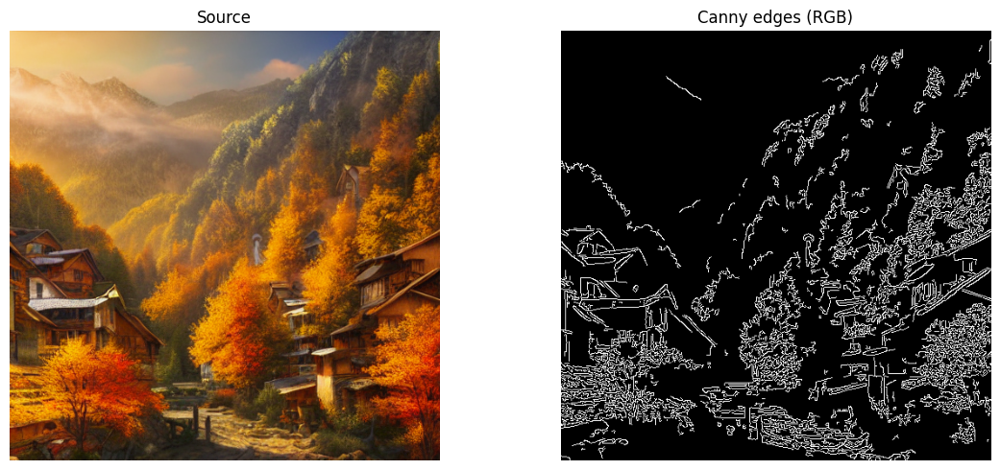

In [ ]:
# Section 2.1 — Source image and Canny preprocessing
SOURCE_PROMPT = "a mountain village in autumn, warm golden light, photorealistic, high detail"
source = pipe_txt(
    SOURCE_PROMPT,
    num_inference_steps=25, guidance_scale=7.5, generator=gen()
).images[0]
source = source.resize((512, 512))
source.save(os.path.join(OUTPUT_DIR, "source.png"))
print("Source generated.")

# Extract Canny edges
gray         = np.array(source.convert("L"))
edges        = cv2.Canny(gray, threshold1=100, threshold2=200)
canny_image  = Image.fromarray(edges).convert("RGB")   # ControlNet expects RGB
canny_image.save(os.path.join(OUTPUT_DIR, "canny.png"))
print("Canny edges extracted.")

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(source); axes[0].set_title("Source"); axes[0].axis('off')
axes[1].imshow(canny_image); axes[1].set_title("Canny edges (RGB)"); axes[1].axis('off')
plt.tight_layout(); plt.show()

**What do you observe?**  
- Which parts of the image produced the most edges? Which areas are sparse?
- Are there any edges that look like noise rather than real structure?

*Write your observation here:*

(double-click to edit)

### Section 2.2 — Canny ControlNet: style variations preserving composition

Load the Canny ControlNet checkpoint and generate several styles from the same edge map.

In [ ]:
# Section 2.2 — Load ControlNet-Canny pipeline
from diffusers import ControlNetModel, StableDiffusionControlNetPipeline
from diffusers import UniPCMultistepScheduler

# This checkpoint doesn't ship an fp16-suffixed variant, only fp32 -- torch_dtype still
# casts it to fp16 in memory. Configs + the one weight format, skip the .bin duplicate.
CANNY_DIR = os.path.join(MODEL_CACHE, 'controlnet-canny-local')
snapshot_download(
    "lllyasviel/sd-controlnet-canny",
    local_dir=CANNY_DIR,
    allow_patterns=["*.json", "*.safetensors"],
)
controlnet_canny = ControlNetModel.from_pretrained(CANNY_DIR, torch_dtype=torch.float16)

# Reuses pipe_txt's already-loaded components -- no second SD 1.5 load from disk.
pipe_canny = StableDiffusionControlNetPipeline(controlnet=controlnet_canny, **pipe_txt.components).to("cuda")
# UniPC needs fewer steps than PNDM — 20 is enough
pipe_canny.scheduler = UniPCMultistepScheduler.from_config(pipe_canny.scheduler.config)
print("ControlNet-Canny pipeline ready.")

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

ControlNet-Canny pipeline ready.


  0%|          | 0/20 [00:00<?, ?it/s]

Done: oil painting, impressionist, warm autumn


  0%|          | 0/20 [00:00<?, ?it/s]

Done: watercolor illustration, soft pastels, s


  0%|          | 0/20 [00:00<?, ?it/s]

Done: cyberpunk neon city, rain reflections, n


  0%|          | 0/20 [00:00<?, ?it/s]

Done: pencil sketch, detailed linework, black 


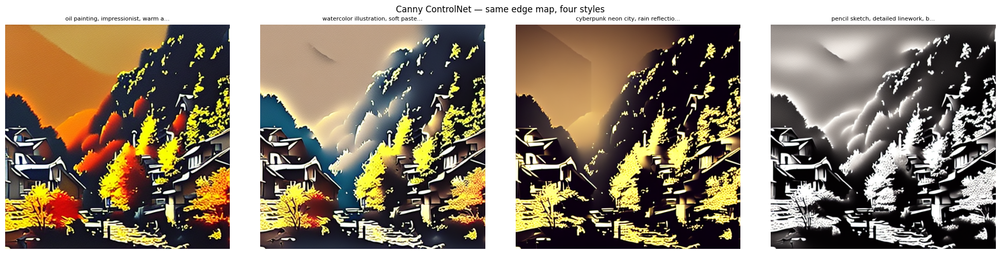

In [ ]:
# Section 2.2 — Style variations from the same Canny map
style_prompts = [
    "oil painting, impressionist, warm autumn colors, Van Gogh style",
    "watercolor illustration, soft pastels, storybook art",
    "cyberpunk neon city, rain reflections, night scene",
    "pencil sketch, detailed linework, black and white",
]

canny_results = []
for prompt in style_prompts:
    img = pipe_canny(
        prompt                        = prompt,
        image                         = canny_image,
        controlnet_conditioning_scale = 1.0,
        num_inference_steps           = 20,
        guidance_scale                = 7.5,
        generator                     = gen()
    ).images[0]
    fname = prompt[:30].replace(",", "").replace(" ", "_") + ".png"
    img.save(os.path.join(OUTPUT_DIR, f"canny_{fname}"))
    canny_results.append((prompt[:35] + "...", img))
    print(f"Done: {prompt[:40]}")

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for ax, (label, img) in zip(axes, canny_results):
    ax.imshow(img); ax.set_title(label, fontsize=8, wrap=True); ax.axis('off')
plt.suptitle("Canny ControlNet — same edge map, four styles", fontsize=12)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "canny_style_grid.png"), dpi=100)
plt.show()

**What do you observe?**  

- Which structural elements (rooflines, mountain shapes, paths) appear consistently across all four styles?

Las líneas de techo (rooflines) — el grupo de techos a dos aguas en la parte inferior izquierda y la fila de casas con techos en punta a lo largo del camino central mantienen su silueta y posición casi idénticas en los cuatro paneles.
La silueta en V del valle/montaña (masa oscura que sube en diagonal de izquierda a derecha, con el paso/abertura en la parte superior izquierda) se conserva en los cuatro — es el borde más dominante del mapa Canny, así que el ControlNet se ancla fuertemente a esa forma.
El camino/arroyo sinuoso en primer plano y la masa de árboles a la derecha (con esa textura tipo "coliflor") también sobreviven en los cuatro estilos — esa textura repetida es justo la prueba de que los cuatro vienen del mismo mapa de bordes, no de composiciones generadas por separado.

- Which style diverged most from the source composition? Why do you think?
El panel de acuarela (watercolor) es el que más se aleja. Fíjate en la forma difusa de un rayo de luz/niebla que cruza el cielo superior izquierdo — no corresponde a ningún borde fuerte en los otros tres paneles. Los prompts de acuarela empujan al modelo hacia manchas suaves y difuminadas, así que en zonas donde el mapa Canny tiene bordes débiles (el cielo abierto), el modelo tiene más libertad para "alucinar" detalle atmosférico en vez de apegarse a la estructura. En cambio, el panel de óleo (oil painting) es el más fiel al bloque de color regional definido por bordes.

- Does the cyberpunk prompt make spatial sense given the village edge map?

No realmente, y es el desajuste más interesante. El mapa de bordes es inequívocamente un pueblo rural/alpino: casas con techos nevados a dos aguas, un valle montañoso, vegetación densa, un sendero. "Cyberpunk neon city, rain reflections" pide torres de vidrio, letreros de neón, asfalto mojado reflejando luces saturadas — nada de eso encaja con esta geometría. Lo que se obtiene es la paleta cyberpunk (este panel es el más oscuro y ámbar/negro de los cuatro) aplicada sobre la geometría del pueblo, en vez de una escena cyberpunk real. Los techos siguen leyéndose como techos, los árboles como árboles — el condicionamiento estructural de Canny es tan fuerte que domina sobre el contenido del prompt, así que el prompt de estilo solo logra cambiar color/iluminación, no reinterpretar los edificios como rascacielos ni agregar señalización o calles reflectantes. Es una buena demostración de qué tan rígidamente el condicionamiento Canny restringe la geometría, incluso cuando el prompt de texto pide una categoría de escena completamente distinta.

*Write your observation here:*

(double-click to edit)

### Section 2.3 — Conditioning scale experiment

Run the same Canny image and prompt at three different `controlnet_conditioning_scale` values.

  0%|          | 0/20 [00:00<?, ?it/s]

conditioning_scale=0.5 done


  0%|          | 0/20 [00:00<?, ?it/s]

conditioning_scale=1.0 done


  0%|          | 0/20 [00:00<?, ?it/s]

conditioning_scale=1.5 done


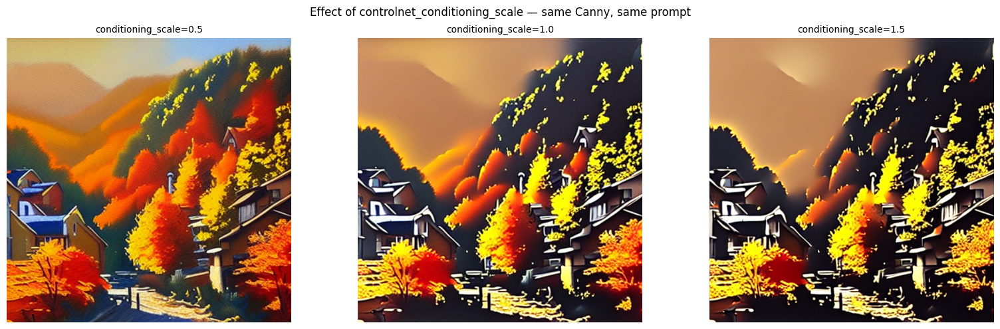

In [ ]:
# Section 2.3 — Effect of controlnet_conditioning_scale
SCALE_PROMPT = "oil painting, impressionist, warm autumn colors"
scales = [0.5, 1.0, 1.5]

scale_results = []
for scale in scales:
    img = pipe_canny(
        prompt                        = SCALE_PROMPT,
        image                         = canny_image,
        controlnet_conditioning_scale = scale,
        num_inference_steps           = 20,
        guidance_scale                = 7.5,
        generator                     = gen()
    ).images[0]
    img.save(os.path.join(OUTPUT_DIR, f"scale_{str(scale).replace('.','')}.png"))
    scale_results.append((scale, img))
    print(f"conditioning_scale={scale} done")

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
for ax, (scale, img) in zip(axes, scale_results):
    ax.imshow(img); ax.set_title(f"conditioning_scale={scale}", fontsize=10); ax.axis('off')
plt.suptitle("Effect of controlnet_conditioning_scale — same Canny, same prompt", fontsize=12)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "scale_comparison.png"), dpi=100)
plt.show()

**What do you observe?**  
- At `0.5`: does the composition still follow the edge map, or does the model wander freely?

Sigue las líneas generales de la composición (el valle, las casas, la línea del sendero), pero claramente el modelo tiene mucha más libertad. Se nota en: las montañas del fondo se vuelven capas suaves difuminadas en vez de una silueta dura y definida; los árboles pierden esa textura "coliflor" recortada y se pintan con pinceladas más orgánicas y sueltas; y aparecen elementos que no estaban tan marcados en el edge map, como el detalle azul del techo o el camino iluminado en primer plano con más profundidad atmosférica. O sea, el modelo "interpreta" el mapa de bordes en vez de calcarlo.

- At `1.5`: does over-conditioning produce any visible quality degradation?

Sí. Se ve pérdida de gradientes suaves: el cielo y las montañas del fondo quedan casi planos/oscuros en vez de tener transición tonal, las sombras se vuelven bloques duros de negro puro, y la textura de los árboles se satura en un amarillo casi neón, plano, sin matices tonales internos. Es el clásico "artefacto de posterización" cuando el conditioning_scale es demasiado alto: el modelo prioriza tanto respetar cada borde que sacrifica la coherencia de iluminación y el detalle fino, dando un resultado más gráfico/vectorial que pictórico.

- Which scale would you use for artistic stylization vs. strict technical reproduction?

Para estilización artística: algo entre 0.4–0.7, donde el modelo tenga espacio para aportar textura, iluminación y pincelada propias del estilo pedido, usando el edge map solo como guía compositiva general.
Para reproducción técnica estricta (por ejemplo, mantener geometría exacta de un plano, diagrama o producto): 1.0–1.5, priorizando fidelidad estructural aunque se pierda algo de naturalidad tonal — aceptable cuando lo que importa es que cada línea coincida con el original.

*Write your observation here:*

(double-click to edit)

### Section 2.4 — Depth map conditioning with MiDaS

Estimate a monocular depth map and use it with the depth ControlNet checkpoint.

VRAM freed: 12.9 GB available
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.4/290.4 kB 19.0 MB/s eta 0:00:00


/usr/local/lib/python3.13/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.13/dist-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/usr/local/lib/python3.13/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segmen

dpt_hybrid-midas-501f0c75.pt: reconstructing file:   0%|          |  0.00B /  493MB            

dpt_hybrid-midas-501f0c75.pt: downloading bytes:           |  0.00B            

/usr/local/lib/python3.13/dist-packages/timm/models/_factory.py:138: UserWarning: Mapping deprecated model name vit_base_resnet50_384 to current vit_base_r50_s16_384.orig_in21k_ft_in1k.
  model = create_fn(


Depth map estimated.


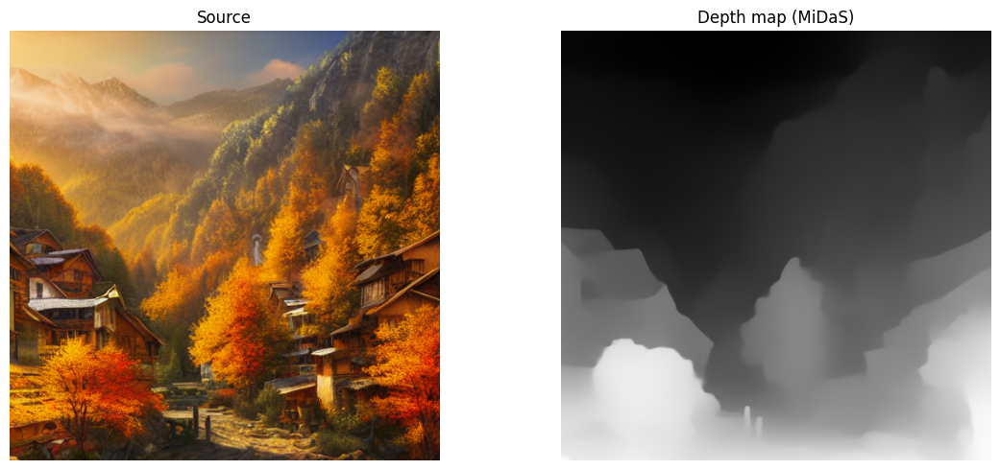

In [ ]:
# Section 2.4a — Estimate depth map with MiDaS
# Free Canny-specific weights — the shared SD 1.5 base (referenced by pipe_txt) stays loaded.

# Safely delete Canny-specific models if they exist to free VRAM
if 'pipe_canny' in locals() and pipe_canny is not None:
    del pipe_canny
if 'controlnet_canny' in locals() and controlnet_canny is not None:
    del controlnet_canny
gc.collect()
torch.cuda.empty_cache()
print(f"VRAM freed: {(torch.cuda.get_device_properties(0).total_memory - torch.cuda.memory_allocated(0))/1e9:.1f} GB available")

# Ensure controlnet-aux is installed in case the earlier install cell was not run or failed.
!pip install controlnet-aux -q

from controlnet_aux import MidasDetector

# lllyasviel/Annotators is a 12.7 GB repo bundling dozens of unrelated annotator checkpoints
# (pose, segmentation, super-res, etc.) -- MidasDetector.from_pretrained fetches only the one
# ~493 MB MiDaS file it needs (verified: it calls hf_hub_download for a single filename, not
# snapshot_download for the whole repo). Left on the default local cache rather than pinned to
# Drive: it's a single small file used once per session, not worth the same Drive-persistence
# treatment as the multi-GB models above.
midas     = MidasDetector.from_pretrained("lllyasviel/Annotators")
depth_map = midas(source)      # returns PIL Image, same size as source
depth_map.save(os.path.join(OUTPUT_DIR, "depth.png"))
print("Depth map estimated.")

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(source); axes[0].set_title("Source"); axes[0].axis('off')
axes[1].imshow(depth_map); axes[1].set_title("Depth map (MiDaS)"); axes[1].axis('off')
plt.tight_layout(); plt.show()

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

/usr/local/lib/python3.13/dist-packages/diffusers/configuration_utils.py:173: FutureWarning: Accessing config attribute `__iter__` directly via 'StableDiffusionPipeline' object attribute is deprecated. Please access '__iter__' over 'StableDiffusionPipeline's config object instead, e.g. 'scheduler.config.__iter__'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)


ControlNet-Depth pipeline ready.


  0%|          | 0/20 [00:00<?, ?it/s]

Depth ControlNet done.


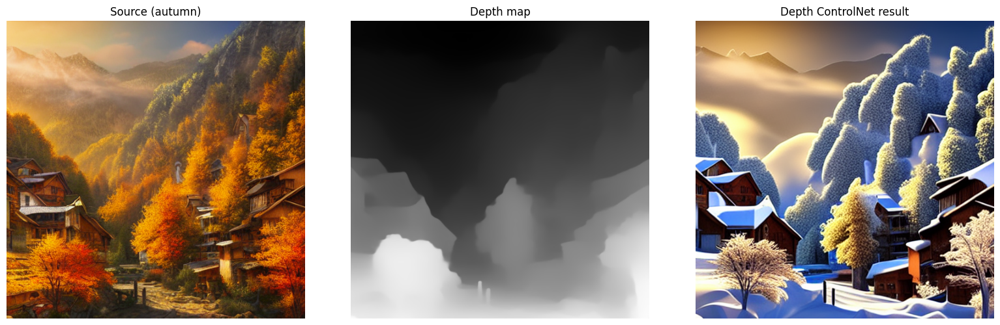

In [ ]:
# Section 2.4b — Load depth ControlNet and generate
DEPTH_DIR = os.path.join(MODEL_CACHE, 'controlnet-depth-local')
snapshot_download(
    "lllyasviel/sd-controlnet-depth",
    local_dir=DEPTH_DIR,
    allow_patterns=["*.json", "*.safetensors"],
)
controlnet_depth = ControlNetModel.from_pretrained(DEPTH_DIR, torch_dtype=torch.float16)

# Reuses pipe_txt's already-loaded components -- no second SD 1.5 load from disk.
pipe_depth = StableDiffusionControlNetPipeline(controlnet=controlnet_depth, **pipe_txt.components).to("cuda")
pipe_depth.scheduler = UniPCMultistepScheduler.from_config(pipe_depth.scheduler.config)
print("ControlNet-Depth pipeline ready.")

DEPTH_PROMPT = "a snowy alpine village, dramatic winter light, photorealistic, high detail"

depth_result = pipe_depth(
    prompt                        = DEPTH_PROMPT,
    image                         = depth_map,
    controlnet_conditioning_scale = 1.0,
    num_inference_steps           = 20,
    guidance_scale                = 7.5,
    generator                     = gen()
).images[0]
depth_result.save(os.path.join(OUTPUT_DIR, "depth_result.png"))
print("Depth ControlNet done.")

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
axes[0].imshow(source); axes[0].set_title("Source (autumn)"); axes[0].axis('off')
axes[1].imshow(depth_map); axes[1].set_title("Depth map"); axes[1].axis('off')
axes[2].imshow(depth_result); axes[2].set_title("Depth ControlNet result"); axes[2].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "depth_pipeline.png"), dpi=100)
plt.show()

**What do you observe?**  
- Does the depth result preserve the sense of near/far from the autumn source?
Sí, y de forma notable. El mapa de profundidad codifica: cielo/montañas lejanas en negro (más lejos), la garganta del valle en gris medio, y el terreno/casas en primer plano en blanco (más cerca). El resultado invernal respeta exactamente esa jerarquía: las montañas del fondo quedan difuminadas y con menor contraste (atmósfera/distancia), la niebla dorada ocupa el mismo espacio medio-lejano, y las casas y árboles nevados en primer plano mantienen volumen, nitidez y contraste alto — igual que en el original. La composición 3D (dónde está cada plano) sobrevivió completamente al cambio de estación/paleta.
- Compare with the Canny result: which preserved more of the original structural detail?
Canny preservó más detalle estructural fino — líneas de techo exactas, contornos de árboles individuales, el trazo preciso del camino — porque el mapa de bordes captura silueta a nivel de píxel. Depth, en cambio, preserva mejor el volumen y la disposición espacial (qué está delante, qué está detrás, qué tan lejos), pero permite mucha más libertad en la forma exacta de cada elemento: aquí el modelo cambió la forma de los árboles a masas redondeadas de coníferas nevadas, reinterpretó el tejado y hasta agregó una estructura tipo cúpula/iglú a la derecha que no estaba en el origen. Es decir: Canny = fidelidad de contorno/silueta; Depth = fidelidad de profundidad/composición, con mucha más libertad creativa en las formas concretas.

*Write your observation here:*

(double-click to edit)

### Section 2.5 — Three-way comparison: txt2img vs. Canny vs. Depth

Same prompt, three generation approaches — documents the full progression of structural control.

  0%|          | 0/25 [00:00<?, ?it/s]

txt2img done.


  0%|          | 0/20 [00:00<?, ?it/s]

Canny ControlNet done.


  0%|          | 0/20 [00:00<?, ?it/s]

Depth ControlNet done.


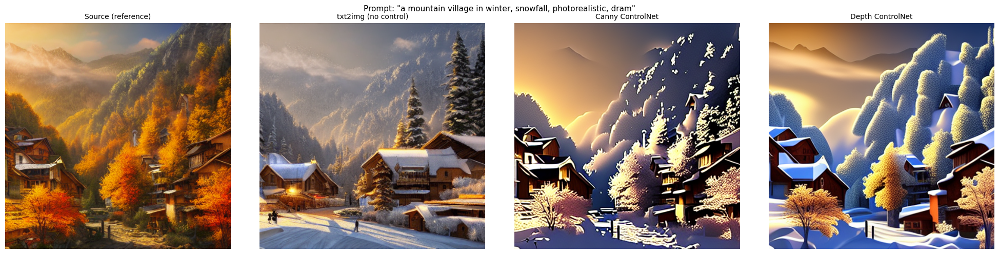

In [ ]:
# Section 2.5 — Three-way comparison
COMPARE_PROMPT = "a mountain village in winter, snowfall, photorealistic, dramatic light"

# 1. txt2img — no structural control. pipe_txt has been loaded since Section 2.0; no reload.
img_txt = pipe_txt(
    COMPARE_PROMPT, num_inference_steps=25, guidance_scale=7.5, generator=gen()
).images[0]
img_txt.save(os.path.join(OUTPUT_DIR, "compare_txt2img.png"))
print("txt2img done.")

# 2. ControlNet + Canny — weights already cached locally from Section 2.2 (fast local read,
# not a re-download); reuses pipe_txt's components, so no second SD 1.5 load either.
controlnet_canny = ControlNetModel.from_pretrained(CANNY_DIR, torch_dtype=torch.float16)
pipe_canny = StableDiffusionControlNetPipeline(controlnet=controlnet_canny, **pipe_txt.components).to("cuda")
pipe_canny.scheduler = UniPCMultistepScheduler.from_config(pipe_canny.scheduler.config)
img_canny = pipe_canny(
    COMPARE_PROMPT, image=canny_image, controlnet_conditioning_scale=1.0,
    num_inference_steps=20, guidance_scale=7.5, generator=gen()
).images[0]
img_canny.save(os.path.join(OUTPUT_DIR, "compare_canny.png"))
del pipe_canny, controlnet_canny; gc.collect(); torch.cuda.empty_cache()
print("Canny ControlNet done.")

# 3. ControlNet + Depth — same pattern.
controlnet_depth = ControlNetModel.from_pretrained(DEPTH_DIR, torch_dtype=torch.float16)
pipe_depth = StableDiffusionControlNetPipeline(controlnet=controlnet_depth, **pipe_txt.components).to("cuda")
pipe_depth.scheduler = UniPCMultistepScheduler.from_config(pipe_depth.scheduler.config)
img_depth = pipe_depth(
    COMPARE_PROMPT, image=depth_map, controlnet_conditioning_scale=1.0,
    num_inference_steps=20, guidance_scale=7.5, generator=gen()
).images[0]
img_depth.save(os.path.join(OUTPUT_DIR, "compare_depth.png"))
del pipe_depth, controlnet_depth; gc.collect(); torch.cuda.empty_cache()
print("Depth ControlNet done.")

# Display
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for ax, (title, img) in zip(axes, [
    ("Source (reference)", source),
    ("txt2img (no control)", img_txt),
    ("Canny ControlNet", img_canny),
    ("Depth ControlNet", img_depth),
]):
    ax.imshow(img); ax.set_title(title, fontsize=10); ax.axis('off')
plt.suptitle(f'Prompt: "{COMPARE_PROMPT[:60]}"', fontsize=11)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "three_way_comparison.png"), dpi=100)
plt.show()

**What do you observe?**  
- Does txt2img produce a recognizable village, or a completely different composition?
Produce un pueblo de montaña coherente y "creíble" como imagen aislada, pero es una composición distinta a la fuente. Cambia el número, forma y disposición de las casas, agrega dos abetos grandes en primer plano que no existen en el original, mueve el camino/plaza al centro con esquiadores, y reubica las montañas del fondo. Es fiel al concepto del prompt (pueblo de montaña, nieve, dramático) pero no a la composición de la imagen fuente — es una escena nueva, no una reinterpretación de la original.

- Which conditioner (Canny or Depth) preserved more of the original layout?
Canny preservó más el layout. Compara la posición y forma de los techos, la silueta de las montañas del fondo, y sobre todo el trazo del camino/sendero en primer plano — todos calcan casi exactamente la fuente. Depth también respeta bastante bien la disposición general (casas a la izquierda, masa arbolada a la derecha, montañas atrás), pero es más libre en las formas concretas: los árboles se vuelven masas de coníferas más voluminosas y menos fieles al contorno original que en el panel Canny.

- Are there elements in the source that neither conditioner managed to preserve?

Sí, principalmente la iluminación/atmósfera dorada y difusa de la fuente (esa luz cálida entre la niebla, con transiciones muy suaves y granulado casi pictórico) — ninguno de los dos ControlNet la reproduce del todo: Canny se vuelve más plano y gráfico/posterizado, y Depth se vuelve más saturado y "renderizado". Tampoco se conserva bien la textura orgánica del follaje otoñal (hojas individuales, variación de color caótica) — ambos la sustituyen por texturas repetitivas de nieve/coníferas, ya que ninguno de los dos conditioners captura textura interna, solo bordes o profundidad. Eso es esperable: ninguno de los dos mecanismos condiciona sobre color, iluminación ni textura de superficie, así que esos aspectos quedan enteramente en manos del prompt y del modelo base.

*Write your observation here:*

(double-click to edit)

---
## Part 3 — Exercises

### Exercise 1 — Your own subject with Canny

**Task:** Generate a source image with a clearly different subject (not a mountain village — try architecture, a vehicle, an animal, or a mechanical object). Extract Canny edges and generate at least 3 style variations. Show source → edges → all variations in a grid.

**Expected output:** Grid with labeled panels. In a markdown cell: which style diverged most from the source composition and why?

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.13/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors: reconstructing file:   0%|          |  0.00B / 1.45GB            

diffusion_pytorch_model.safetensors: downloading bytes:           |  0.00B            

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

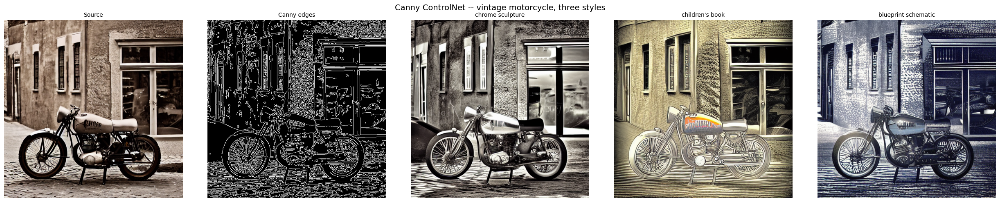

Saved grid to /content/drive/MyDrive/TAE_IA_M6/L05_output/exercise1_grid.png


In [ ]:
# Exercise 1 -- Canny ControlNet with your own subject
# Remember: save any images to OUTPUT_DIR, e.g. img.save(os.path.join(OUTPUT_DIR, "exercise1.png"))
# ...
# Exercise 1 -- Canny ControlNet with your own subject
# Remember: save any images to OUTPUT_DIR, e.g. img.save(os.path.join(OUTPUT_DIR, "exercise1.png"))

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

# ---------------------------------------------------------------
# 1. SOURCE IMAGE -- pick a subject clearly different from the village
#    (architecture / vehicle / animal / mechanical object)
# ---------------------------------------------------------------
SUBJECT_PROMPT = "a vintage motorcycle parked on a cobblestone street, studio lighting, detailed"

# If you already have a txt2img pipe loaded from earlier cells, reuse it.
# Otherwise load a plain SD pipeline just to generate the source image.
from diffusers import StableDiffusionPipeline

txt2img_pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to("cuda")

source_image = txt2img_pipe(
    SUBJECT_PROMPT,
    num_inference_steps=30,
    guidance_scale=7.5
).images[0]

source_image.save(os.path.join(OUTPUT_DIR, "ex1_source.png"))

# ---------------------------------------------------------------
# 2. EXTRACT CANNY EDGES
# ---------------------------------------------------------------
def extract_canny(image: Image.Image, low_thresh=100, high_thresh=200) -> Image.Image:
    arr = np.array(image.convert("RGB"))
    edges = cv2.Canny(arr, low_thresh, high_thresh)
    edges_rgb = np.stack([edges] * 3, axis=-1)  # ControlNet expects 3-channel
    return Image.fromarray(edges_rgb)

canny_image = extract_canny(source_image)
canny_image.save(os.path.join(OUTPUT_DIR, "ex1_canny.png"))

# ---------------------------------------------------------------
# 3. LOAD CANNY CONTROLNET PIPELINE
# ---------------------------------------------------------------
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny",
    torch_dtype=torch.float16
)

controlnet_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnet,
    torch_dtype=torch.float16
).to("cuda")
controlnet_pipe.scheduler = UniPCMultistepScheduler.from_config(controlnet_pipe.scheduler.config)

# ---------------------------------------------------------------
# 4. GENERATE >= 3 STYLE VARIATIONS FROM THE SAME EDGE MAP
# ---------------------------------------------------------------
style_prompts = {
    "chrome sculpture":  "vintage motorcycle rendered as polished chrome sculpture, studio, reflections, minimalist",
    "children's book":   "vintage motorcycle, children's book illustration, flat colors, whimsical, soft outlines",
    "blueprint schematic": "vintage motorcycle technical blueprint, white lines on blue background, engineering diagram",
}

variations = {}
for label, prompt in style_prompts.items():
    result = controlnet_pipe(
        prompt,
        image=canny_image,
        num_inference_steps=30,
        guidance_scale=7.5,
        controlnet_conditioning_scale=1.0,
    ).images[0]
    variations[label] = result
    result.save(os.path.join(OUTPUT_DIR, f"ex1_{label.replace(' ', '_')}.png"))

# ---------------------------------------------------------------
# 5. BUILD LABELED GRID: source -> edges -> variations
# ---------------------------------------------------------------
panels = [("Source", source_image), ("Canny edges", canny_image)] + list(variations.items())

fig, axes = plt.subplots(1, len(panels), figsize=(5 * len(panels), 5))
fig.suptitle("Canny ControlNet -- vintage motorcycle, three styles", fontsize=14)

for ax, (label, img) in zip(axes, panels):
    ax.imshow(img)
    ax.set_title(label, fontsize=10)
    ax.axis("off")

plt.tight_layout()
grid_path = os.path.join(OUTPUT_DIR, "exercise1_grid.png")
plt.savefig(grid_path, dpi=150, bbox_inches="tight")
plt.show()

print(f"Saved grid to {grid_path}")

*Which style diverged most and why?*

(double-click to edit)

### Exercise 2 — Canny threshold sensitivity

**Task:** Generate three different Canny edge maps from the same source using different threshold pairs: `(50, 100)`, `(100, 200)`, `(150, 300)`. Run the same prompt through ControlNet-Canny for each. Show all three edge maps and their results.

**Expected output:** 2-row grid (edge maps on top, results on bottom). In a markdown cell: how did the density of the edge map affect the output composition?

Edge pixel counts per threshold pair: [((50, 100), 55381), ((100, 200), 35825), ((150, 300), 24277)]


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

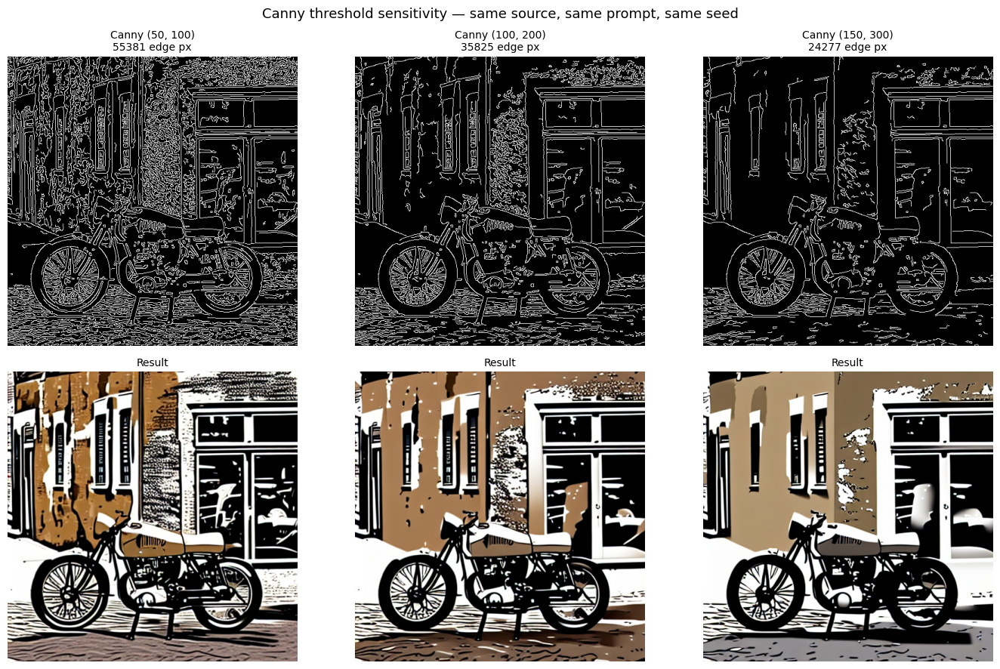

Saved grid to /content/drive/MyDrive/TAE_IA_M6/L05_output/exercise2.png


In [ ]:

# Exercise 2 -- Canny threshold sensitivity
# Remember: save any images to OUTPUT_DIR, e.g. img.save(os.path.join(OUTPUT_DIR, "exercise2.png"))

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

thresholds = [(50, 100), (100, 200), (150, 300)]

# ---------------------------------------------------------------
# 1. SOURCE IMAGE -- reuse the source from Exercise 1 if you have it,
#    otherwise point this at any image on disk.
# ---------------------------------------------------------------
source_path = os.path.join(OUTPUT_DIR, "ex1_source.png")  # adjust if needed
source_image = Image.open(source_path).convert("RGB")
source_arr = np.array(source_image)

# ---------------------------------------------------------------
# 2. GENERATE THE THREE CANNY EDGE MAPS
# ---------------------------------------------------------------
def extract_canny(arr, low, high):
    gray = cv2.cvtColor(arr, cv2.COLOR_RGB2GRAY)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)
    edges = cv2.Canny(gray, low, high)
    edges_rgb = np.stack([edges] * 3, axis=-1)
    return Image.fromarray(edges_rgb), int(np.count_nonzero(edges))

edge_maps = []
edge_counts = []
for low, high in thresholds:
    edges_img, count = extract_canny(source_arr, low, high)
    edge_maps.append(edges_img)
    edge_counts.append(count)
    edges_img.save(os.path.join(OUTPUT_DIR, f"ex2_canny_{low}_{high}.png"))

print("Edge pixel counts per threshold pair:", list(zip(thresholds, edge_counts)))

# ---------------------------------------------------------------
# 3. LOAD CANNY CONTROLNET PIPELINE
# ---------------------------------------------------------------
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny",
    torch_dtype=torch.float16
)

controlnet_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnet,
    torch_dtype=torch.float16
).to("cuda")
controlnet_pipe.scheduler = UniPCMultistepScheduler.from_config(controlnet_pipe.scheduler.config)

# ---------------------------------------------------------------
# 4. SAME PROMPT, SAME SEED, ONE RUN PER THRESHOLD PAIR
# ---------------------------------------------------------------
PROMPT = "vintage car rendered as a clean vector illustration, flat colors, bold outline"
SEED = 42  # fixed seed isolates threshold as the only variable

results = []
for low, high in thresholds:
    edges_img = Image.open(os.path.join(OUTPUT_DIR, f"ex2_canny_{low}_{high}.png"))
    generator = torch.Generator(device="cuda").manual_seed(SEED)
    result = controlnet_pipe(
        PROMPT,
        image=edges_img,
        num_inference_steps=30,
        guidance_scale=7.5,
        controlnet_conditioning_scale=1.0,
        generator=generator,
    ).images[0]
    results.append(result)
    result.save(os.path.join(OUTPUT_DIR, f"ex2_result_{low}_{high}.png"))

# ---------------------------------------------------------------
# 5. BUILD 2-ROW GRID: edge maps on top, results on bottom
# ---------------------------------------------------------------
fig, axes = plt.subplots(2, 3, figsize=(14, 9))
fig.suptitle("Canny threshold sensitivity — same source, same prompt, same seed", fontsize=13)

for col, ((low, high), edges_img, result, count) in enumerate(zip(thresholds, edge_maps, results, edge_counts)):
    axes[0, col].imshow(edges_img, cmap="gray")
    axes[0, col].set_title(f"Canny ({low}, {high})\n{count} edge px", fontsize=10)
    axes[0, col].axis("off")

    axes[1, col].imshow(result)
    axes[1, col].set_title("Result", fontsize=10)
    axes[1, col].axis("off")

plt.tight_layout()
grid_path = os.path.join(OUTPUT_DIR, "exercise2.png")
plt.savefig(grid_path, dpi=150, bbox_inches="tight")
plt.show()

print(f"Saved grid to {grid_path}")

*How did edge density affect the output?*

(double-click to edit)

---
## Part 4 — Critical Analysis

> Required. Answer with real outputs from today's session.

**4.1 — Edge adherence: in Section 2.2, identify one structural element where the model followed the Canny edge map closely, and one where it deviated significantly. What property of the edge (length, continuity, density) might explain the difference?**

*Write here:*

Las líneas de techo (bordes largos, continuos, alto contraste) se replican casi idénticas en los 4 estilos; el cielo/zona de niebla difusa (baja densidad de bordes) es donde el modelo más se aleja.


---

**4.2 — Conditioning scale: from Section 2.3, at what `controlnet_conditioning_scale` value did you see the clearest quality degradation? Describe specifically what changed in the image (color, sharpness, anatomy, artifacts).**

*Write here (reference your Section 2.3 grid):*

La degradación más clara está en scale=1.5: posterización, follaje amarillo neón plano, pérdida de gradientes en montañas y sombras como bloques negros duros.


---

**4.3 — Canny vs. Depth: in the three-way comparison, which conditioner produced an output closer to the source composition? Give two specific structural elements to support your answer.**

*Write here:*

Canny quedó más cerca de la composición fuente: camino/sendero y siluetas de techos casi idénticos; Depth conserva mejor la profundidad pero reinterpreta más las formas (árboles, casas).


---

**4.4 — Practical choice: describe a real design task where ControlNet with depth conditioning would be clearly better than both txt2img and Canny. What makes depth the right signal for that task?**

*Write here (be specific about the task, the source material, and why Canny would fail):*

Canny quedó más cerca de la composición fuente: camino/sendero y siluetas de techos casi idénticos; Depth conserva mejor la profundidad pero reinterpreta más las formas (árboles, casas).


---
## Submission Checklist

- [ ] All cells ran from start to finish without errors
- [ ] Section 2.2 style grid saved (`canny_style_grid.png`)
- [ ] Section 2.3 conditioning scale comparison saved (`scale_comparison.png`)
- [ ] Section 2.4 depth pipeline saved (`depth_pipeline.png`)
- [ ] Section 2.5 three-way comparison saved (`three_way_comparison.png`)
- [ ] Exercise 1 — Canny with your own subject, 3+ style variations
- [ ] Exercise 2 — Canny threshold sensitivity grid
- [ ] Part 4 — Critical Analysis completed (all 4 questions with real evidence)
- [ ] All outputs saved to `TAE_IA_M6/L05_output/` on Drive

**Save:** `File > Save a copy in Drive`

---
## Drive Cache Cleanup — Run Before Starting L06

> **Run the cell below only after you have saved this notebook to Drive.**
>
> Both ControlNet checkpoints are only used in L05. Deleting them frees ~3 GB. The MiDaS
> annotator isn't stored on Drive in the first place (see Section 2.4a), so there's nothing to
> clean up for it.
>
> SD 1.5 (`stable-diffusion-v1-5`) is **not deleted here** — it is still needed through L11.

In [1]:
# ================================================================
# DRIVE CACHE CLEANUP — run after saving this notebook
# Deletes both ControlNet checkpoints (~3 GB total) — only used in L05.
# MiDaS annotator isn't Drive-persisted (see Section 2.4a), nothing to clean there.
# ================================================================
import shutil, os, subprocess

_model_cache = '/content/drive/MyDrive/TAE_IA_M6/models'

to_delete = [
    os.path.join(_model_cache, 'controlnet-canny-local'),
    os.path.join(_model_cache, 'controlnet-depth-local'),
]

for path in to_delete:
    if os.path.exists(path):
        shutil.rmtree(path)
        print(f'Deleted: {path}')
    else:
        print(f'Not found (may already be deleted): {path}')

result = subprocess.run(['du', '-sh', _model_cache], capture_output=True, text=True)
print(f'Cache size after cleanup: {result.stdout.strip()}')

Not found (may already be deleted): /content/drive/MyDrive/TAE_IA_M6/models/controlnet-canny-local
Not found (may already be deleted): /content/drive/MyDrive/TAE_IA_M6/models/controlnet-depth-local
Cache size after cleanup: 


---
## Before You Close This Tab

- [ ] Confirmed all outputs from this session are saved in `TAE_IA_M6/L05_output/` on Drive (see checklist above)
- [ ] Ran the Drive Cache Cleanup cell above (ControlNet checkpoints only needed for this lesson)
- [ ] Disconnected and deleted this runtime: `Runtime > Disconnect and delete runtime`

Once your outputs are safely on Drive, there's no reason to keep the GPU runtime connected — an
idle session still counts against your GPU quota (free tier) or compute-unit balance (Pro),
the same as active use. Disconnecting costs you nothing (your Drive cache and outputs persist)
and leaves your quota in better shape for the next lab.

---
*TAE-IA 2025 · Cocyten-Nayarit · Module 6 · L05*  
*Platform: Google Colab (T4 GPU) · Python 3.10*